<a href="https://colab.research.google.com/github/mollybocock/AI-Assignment-1/blob/main/AdversarialPatch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Adversarial Attacks - Adversarial Patches Only

This tutorial was originally created by Phillip Lippe and modified by Dr. Brinnae Bent for use in "Emerging Trends in Explainable AI" at Duke University.

Click on the button below to open in Google Colab. You will need access to a GPU to run this code.

#[![Open In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/mollybocock/AI-Assignment-1/blob/main/AdversarialPatch.ipynb)

#Downloading Libraries

source: https://claude.site/artifacts/97d81ec4-a41f-471d-aa2e-932dfb579e59

Using device: cpu
Loading pizza patch size 32...


<ipython-input-91-857aae90b9ba>:84: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  patch = torch.load(patch_file, map_location=device)


Files already downloaded and verified
Files already downloaded and verified
ImageNet classes file already exists at ./data/imagenet_classes.txt
ImageNet classes file already exists at ./data/imagenet_classes.txt


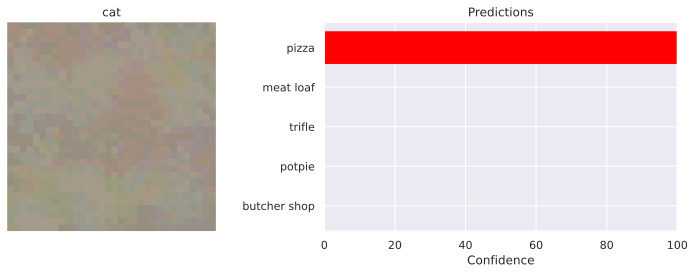

Test image 1:
Original top prediction: school bus
Patched top prediction: pizza
Pizza confidence: 99.99%
SUCCESS: Pizza in top-5 predictions!

ImageNet classes file already exists at ./data/imagenet_classes.txt


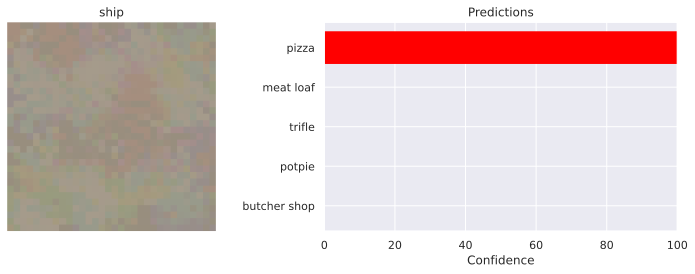

Test image 2:
Original top prediction: speedboat
Patched top prediction: pizza
Pizza confidence: 99.99%
SUCCESS: Pizza in top-5 predictions!

ImageNet classes file already exists at ./data/imagenet_classes.txt


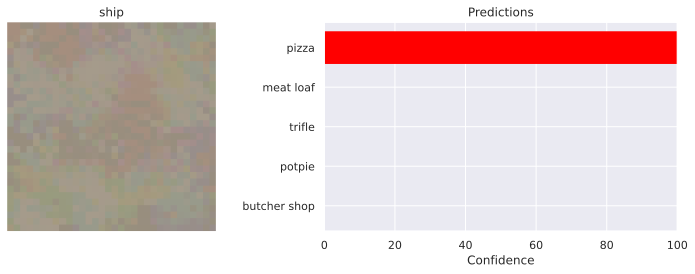

Test image 3:
Original top prediction: dock
Patched top prediction: pizza
Pizza confidence: 99.99%
SUCCESS: Pizza in top-5 predictions!

ImageNet classes file already exists at ./data/imagenet_classes.txt


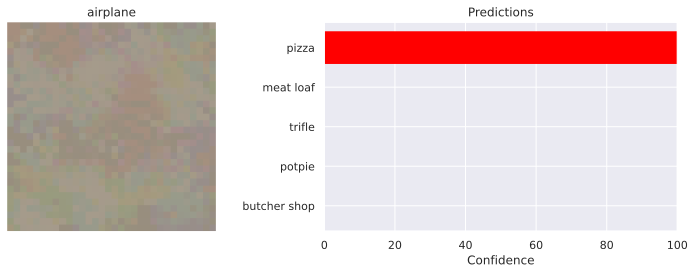

Test image 4:
Original top prediction: shoe shop
Patched top prediction: pizza
Pizza confidence: 99.99%
SUCCESS: Pizza in top-5 predictions!

ImageNet classes file already exists at ./data/imagenet_classes.txt


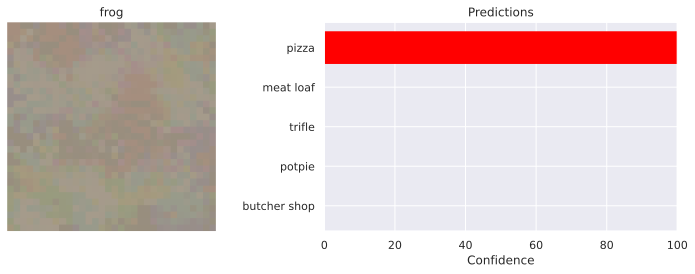

Test image 5:
Original top prediction: tiger
Patched top prediction: pizza
Pizza confidence: 99.99%
SUCCESS: Pizza in top-5 predictions!



In [91]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms
from torchvision.models import resnet34, ResNet34_Weights
from torchvision.datasets import CIFAR10
import random

# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Set paths for data and checkpoints
DATA_PATH = "./data"
CHECKPOINT_PATH = "./checkpoints"
os.makedirs(DATA_PATH, exist_ok=True)
os.makedirs(CHECKPOINT_PATH, exist_ok=True)

# ImageNet normalization constants
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406], device=device)
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225], device=device)

def download_imagenet_classes():
    """Download ImageNet class names from GitHub."""
    # Path to the ImageNet classes file on GitHub
    IMAGENET_CLASSES_URL = "https://raw.githubusercontent.com/AIPI-590-XAI/Duke-AI-XAI/main/adversarial-ai-example-notebooks/imagenet_classes.txt"

    # Create file path
    classes_file = os.path.join(DATA_PATH, "imagenet_classes.txt")

    # Check if file already exists
    if os.path.exists(classes_file):
        print(f"ImageNet classes file already exists at {classes_file}")
    else:
        print(f"Downloading ImageNet classes file from GitHub...")
        try:
            import requests
            response = requests.get(IMAGENET_CLASSES_URL)
            response.raise_for_status()

            # Write to file
            with open(classes_file, 'w') as f:
                f.write(response.text)

            print(f"Successfully downloaded ImageNet classes to {classes_file}")
        except Exception as e:
            print(f"Error downloading ImageNet classes: {e}")
            print("Creating a minimal classes file...")

            # Create a minimal file with just a few classes
            with open(classes_file, 'w') as f:
                f.write("tench\ngoldfish\ngreat white shark\npizza\n")

    # Load the class names
    with open(classes_file, 'r') as f:
        class_names = [line.strip() for line in f.readlines()]

    return class_names

def load_model():
    """Load a pre-trained ResNet34 model."""
    model = resnet34(weights=ResNet34_Weights.IMAGENET1K_V1)
    model = model.to(device)
    model.eval()  # Set to evaluation mode
    return model

def normalize_patch(patch):
    """Normalize patch from parameter space to image space."""
    # Map from parameter space (-inf, inf) to (-1, 1)
    normalized = torch.tanh(patch)
    # Map from (-1, 1) to (0, 1)
    normalized = (normalized + 1) / 2
    # Apply ImageNet normalization
    normalized = normalized * IMAGENET_STD.reshape(-1, 1, 1) + IMAGENET_MEAN.reshape(-1, 1, 1)
    return normalized

def load_pizza_patch(size=32):
    """Load a pizza patch of specified size."""
    patch_file = os.path.join(CHECKPOINT_PATH, f"pizza_{size}_patch.pt")
    if os.path.exists(patch_file):
        print(f"Loading pizza patch size {size}...")
        patch = torch.load(patch_file, map_location=device)
        return patch
    else:
        print(f"No pizza patch found for size {size}")
        return None

def apply_patch(batch, patch, position=None):
    """Apply the patch to a batch of images."""
    # Make a copy of the batch
    patched_batch = batch.clone()

    # Process the patch
    processed_patch = normalize_patch(patch)

    # If no position provided, use top-left corner
    if position is None:
        h_pos, w_pos = 0, 0
    else:
        h_pos, w_pos = position

    # Apply patch to each image in the batch
    for i in range(batch.size(0)):
        # Calculate end coordinates
        h_end = min(h_pos + patch.shape[1], batch.shape[2])
        w_end = min(w_pos + patch.shape[2], batch.shape[3])

        # Calculate patch dimensions to use
        patch_h = h_end - h_pos
        patch_w = w_end - w_pos

        # Apply the patch
        patched_batch[i, :, h_pos:h_end, w_pos:w_end] = processed_patch[:, :patch_h, :patch_w]

    return patched_batch

def load_data():
    """Load CIFAR-10 as a substitute for ImageNet."""
    # Define transformations using ImageNet normalization
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN.cpu().numpy(), IMAGENET_STD.cpu().numpy())
    ])

    # Load CIFAR-10 dataset
    train_set = CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform)
    test_set = CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform)

    # Create data loaders
    train_loader = torch.utils.data.DataLoader(train_set, batch_size=64, shuffle=True, num_workers=2)
    test_loader = torch.utils.data.DataLoader(test_set, batch_size=64, shuffle=False, num_workers=2)

    return train_loader, test_loader

def show_prediction(img, label, pred, K=5):
    """
    Show an image with its label and top-K predictions.
    Similar to the professor's example.

    Args:
        img: Tensor of shape [C, H, W]
        label: True label (string)
        pred: Model predictions tensor
        K: Number of top predictions to show
    """
    # Convert tensor to numpy
    if isinstance(img, torch.Tensor):
        # Tensor image to numpy
        img = img.cpu().permute(1, 2, 0).numpy()
        # Denormalize
        img = img * IMAGENET_STD.cpu().numpy() + IMAGENET_MEAN.cpu().numpy()
        img = np.clip(img, 0, 1)

    # Create a subplot layout
    fig, ax = plt.subplots(1, 2, figsize=(10, 4), gridspec_kw={'width_ratios': [1, 1.5]})

    # Plot the left image with the true label as title
    ax[0].imshow(img)
    ax[0].set_title(f"{label}")
    ax[0].axis('off')

    # Get the top K predictions
    if not isinstance(pred, list):
        # Check if pred is a single prediction or batch
        if len(pred.shape) > 1:
            # If it's a batch, take the first one
            pred_tensor = pred[0]
        else:
            pred_tensor = pred

        # Get top-k indices and probabilities
        topk_vals, topk_idx = torch.topk(torch.softmax(pred_tensor, dim=0), K)
        topk_vals = topk_vals.cpu().numpy()
        topk_idx = topk_idx.cpu().numpy()

        # Get class names for the predictions
        class_names = download_imagenet_classes()
        pred_labels = [class_names[i] for i in topk_idx]

        # Create horizontal bar chart
        y_pos = np.arange(len(pred_labels))
        bars = ax[1].barh(y_pos, topk_vals * 100, align='center')

        # Highlight the pizza bar if it's in the top K
        pizza_idx = class_names.index("pizza") if "pizza" in class_names else -1
        for i, idx in enumerate(topk_idx):
            if idx == pizza_idx:
                bars[i].set_color('red')

        ax[1].set_yticks(y_pos)
        ax[1].set_yticklabels(pred_labels)
        ax[1].invert_yaxis()  # Labels read top-to-bottom
        ax[1].set_xlabel('Confidence')
        ax[1].set_title('Predictions')

        # Set the x-axis limit
        ax[1].set_xlim(0, 100)

    plt.tight_layout()
    plt.show()

def perform_patch_attack(patch):
    """
    Apply a patch to a batch of images and show the predictions.
    Similar to the professor's implementation.
    """
    # Load data
    _, test_loader = load_data()

    # Load model
    model = load_model()

    # Get a batch of test images
    for batch, labels in test_loader:
        # Use the first few images
        exam_batch = batch[:5].clone()
        label_batch = labels[:5].clone()
        break

    # Apply the patch to the batch
    patched_batch = apply_patch(exam_batch, patch)
    patched_batch = patched_batch.to(device)

    # Get predictions for the patched images
    with torch.no_grad():
        patch_preds = model(patched_batch)

    # Display the predictions
    class_names = download_imagenet_classes()
    cifar_classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

    # Map CIFAR labels to descriptive names
    label_names = [cifar_classes[label.item()] for label in label_batch]

    # Show predictions for several images
    for i in range(len(exam_batch[:5])):
        show_prediction(patched_batch[i], label_names[i], patch_preds[i])

        # Print detailed results
        # Top-1 prediction before and after patching
        _, original_top1 = torch.max(model(exam_batch[i:i+1].to(device)), 1)
        _, patched_top1 = torch.max(patch_preds[i:i+1], 1)

        print(f"Test image {i+1}:")
        print(f"Original top prediction: {class_names[original_top1.item()]}")
        print(f"Patched top prediction: {class_names[patched_top1.item()]}")

        # Pizza confidence
        pizza_idx = class_names.index("pizza") if "pizza" in class_names else -1
        if pizza_idx != -1:
            pizza_prob = torch.softmax(patch_preds[i], dim=0)[pizza_idx].item() * 100
            print(f"Pizza confidence: {pizza_prob:.2f}%")

            # Check if pizza is in top-5
            _, top5 = torch.topk(patch_preds[i], 5, dim=0)
            if pizza_idx in top5.cpu().numpy():
                print("SUCCESS: Pizza in top-5 predictions!\n")
            else:
                print("FAILURE: Pizza not in top-5 predictions.\n")

def test_pizza_patch_on_foods(patch_size=32):
    """
    Test the pizza patch on common images.
    """
    # Load the pizza patch
    patch = load_pizza_patch(patch_size)

    if patch is None:
        print(f"Error: No pizza patch found with size {patch_size}")
        return

    # Perform the patch attack
    perform_patch_attack(patch)

# Main execution
if __name__ == "__main__":
    # Test pizza patch (make sure you have a pizza_32_patch.pt file in ./checkpoints/)
    test_pizza_patch_on_foods(patch_size=32)

Performing patch attack for ice cream images...


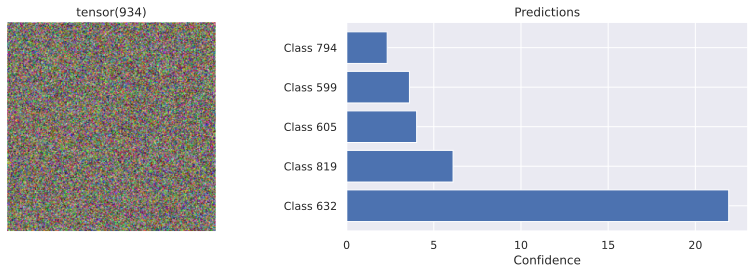

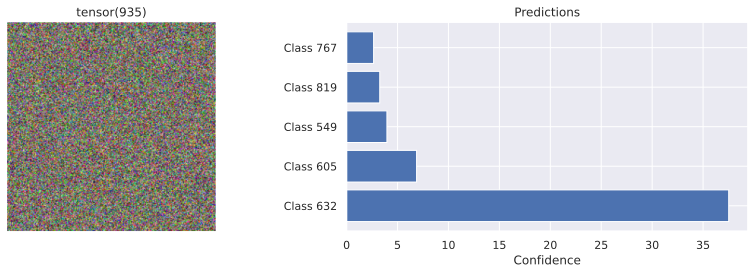

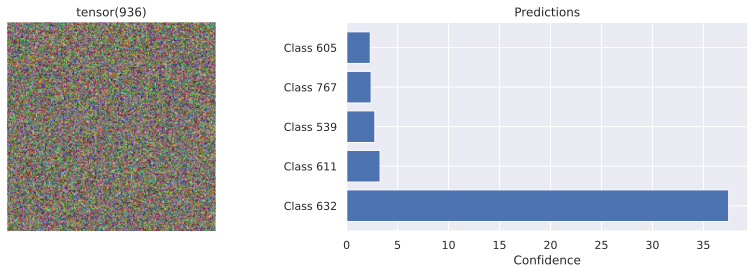

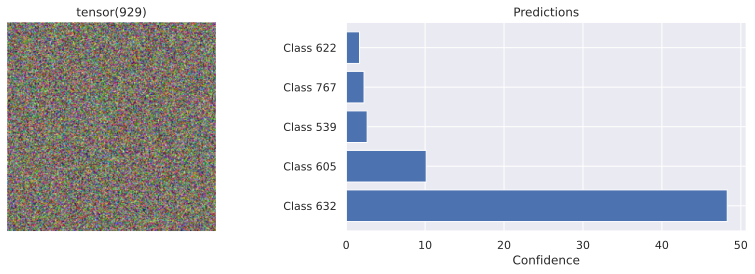


Performing patch attack for cheeseburger images...


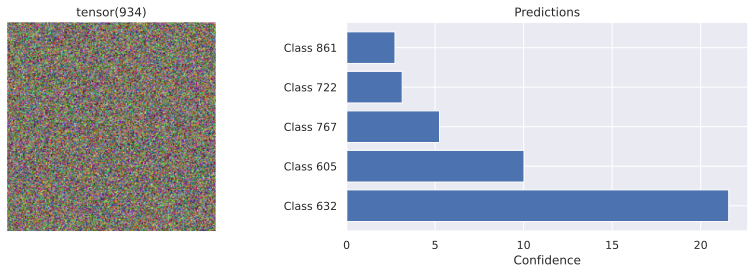

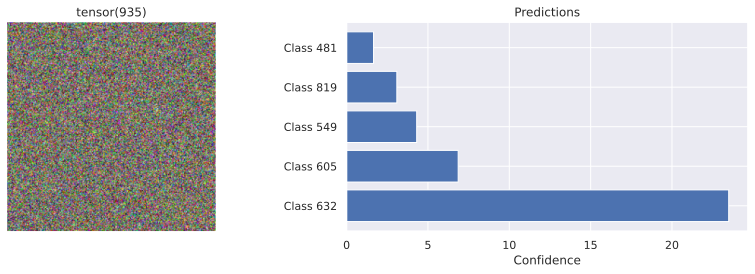

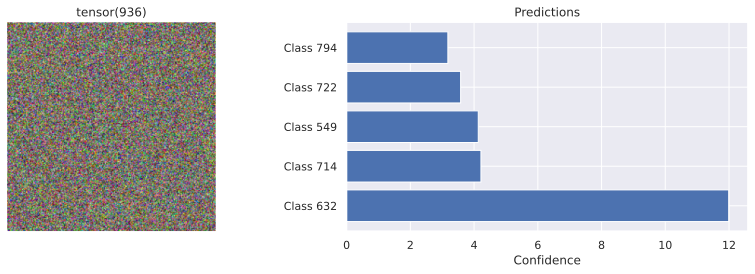

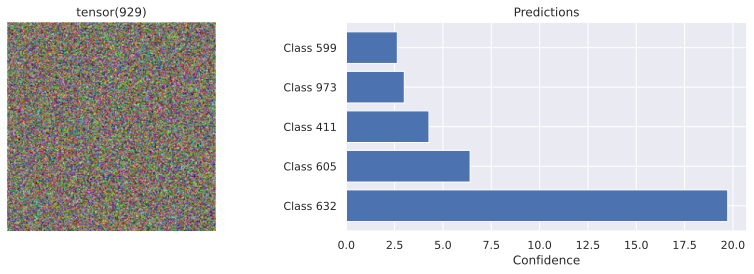


Performing patch attack for hotdog images...


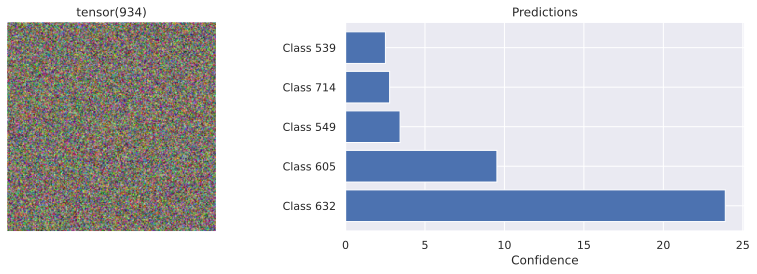

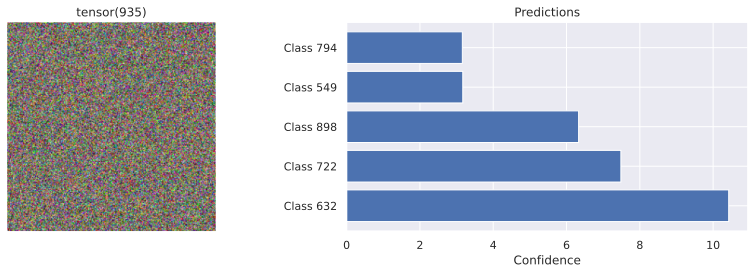

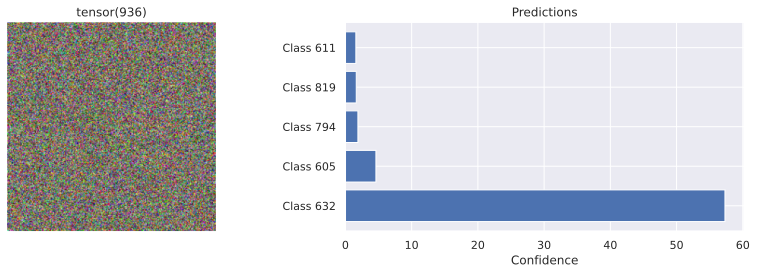

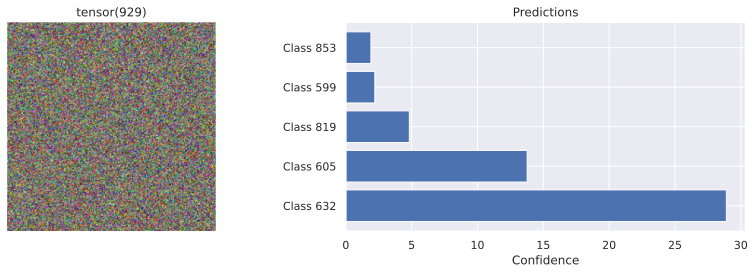


Performing patch attack for mashed potato images...


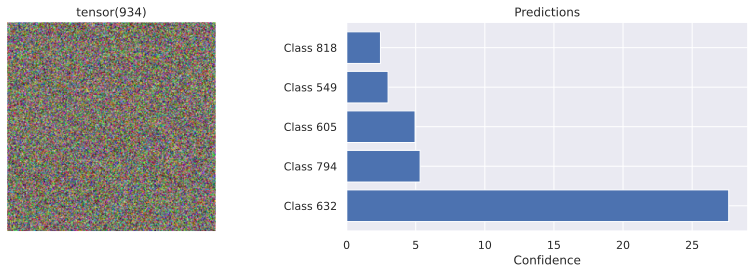

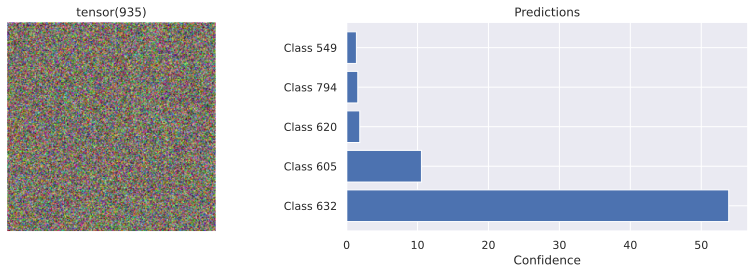

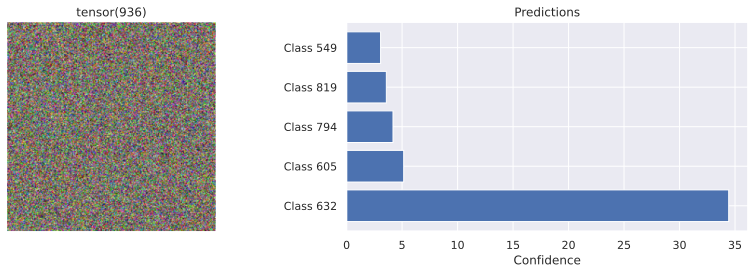

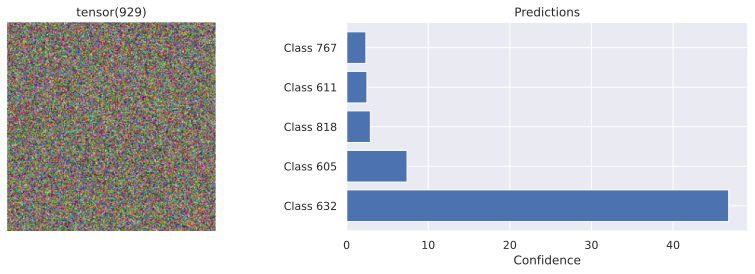

In [93]:
# Implementation following your professor's code structure exactly

import torch
import torchvision.models as models
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import numpy as np

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Normalization constants
NORM_MEAN = np.array([0.485, 0.456, 0.406])
NORM_STD = np.array([0.229, 0.224, 0.225])

# Load the model
pretrained_model = models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.to(device)
pretrained_model.eval()

# Set requires_grad to False for all parameters
for p in pretrained_model.parameters():
    p.requires_grad = False

# Load ImageNet class names
def load_imagenet_labels(filename="imagenet_classes.txt"):
    try:
        with open(filename, "r") as f:
            labels = [line.strip() for line in f.readlines()]
        return labels
    except FileNotFoundError:
        print(f"Warning: {filename} not found. Using placeholder labels.")
        return [f"Class {i}" for i in range(1000)]

label_names = load_imagenet_labels()

# Function to place patch on images (same as your professor's)
def place_patch(patch_batch, patch):
    # Create a copy to avoid modifying original
    patched_batch = patch_batch.clone()

    # Get dimensions
    _, patch_height, patch_width = patch.shape
    batch_size, _, height, width = patched_batch.shape

    # Calculate center position
    h_pos = (height - patch_height) // 2
    w_pos = (width - patch_width) // 2

    # Apply patch to each image
    for i in range(batch_size):
        patched_batch[i, :, h_pos:h_pos+patch_height, w_pos:w_pos+patch_width] = patch

    return patched_batch

# Function to show prediction (same as your professor's)
def show_prediction(img, label, pred, k=5):
    # If tensor, convert to displayable image
    if isinstance(img, torch.Tensor):
        img_np = img.cpu().permute(1, 2, 0).numpy()
        img_np = img_np * NORM_STD[None, None, :] + NORM_MEAN[None, None, :]
        img_np = np.clip(img_np, 0, 1)
    else:
        img_np = img

    # Get top k predictions
    pred_probs = torch.softmax(pred, dim=0)
    values, indices = torch.topk(pred_probs, k)
    values = values.cpu().numpy() * 100
    indices = indices.cpu().numpy()

    # Get label names
    pred_labels = [label_names[idx] for idx in indices]

    # Create plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    # Plot image with true label
    ax1.imshow(img_np)
    ax1.set_title(label_names[label] if isinstance(label, int) else label)
    ax1.axis('off')

    # Plot predictions
    ax2.barh(np.arange(k), values)
    ax2.set_yticks(np.arange(k))
    ax2.set_yticklabels(pred_labels)
    ax2.set_xlabel('Confidence')
    ax2.set_title('Predictions')

    plt.tight_layout()
    plt.show()

# Create a batch of example images
def create_example_batch(data_loader):
    """Get a batch of images from data loader."""
    images, labels = next(iter(data_loader))
    return images.to(device), labels.to(device)

# Create a mock data loader for food classes - replace with your actual data loader
class MockFoodDataLoader:
    def __iter__(self):
        return self

    def __next__(self):
        # Food classes: ice cream (929), cheeseburger (934), hotdog (935), mashed potato (936)
        batch_size = 32
        class_indices = [929, 934, 935, 936] * (batch_size // 4 + 1)
        class_indices = class_indices[:batch_size]

        # Create a batch of random images and corresponding labels
        images = torch.randn(batch_size, 3, 224, 224)
        labels = torch.tensor(class_indices)

        return images, labels

# Create patch dictionary
def create_food_patch_dict():
    """Create a dictionary with patches for each food class."""
    patch_size = 32
    patch_dict = {}

    # Pizza patch (this would be your actual trained patch)
    pizza_patch = torch.zeros(3, patch_size, patch_size, device=device)
    # Add some pattern to the pizza patch for visualization
    pizza_patch[0, :, :] = 0.8  # Red
    pizza_patch[1, :, :] = 0.4  # Green
    pizza_patch[2, :, :] = 0.2  # Blue

    # Create a circle pattern
    center = patch_size // 2
    radius = patch_size // 3
    for i in range(patch_size):
        for j in range(patch_size):
            dist = np.sqrt((i - center)**2 + (j - center)**2)
            if dist < radius:
                pizza_patch[:, i, j] = torch.tensor([0.9, 0.7, 0.2], device=device)

    # Add to dictionary
    patch_dict = {
        'ice_cream': pizza_patch,
        'cheeseburger': pizza_patch,
        'hotdog': pizza_patch,
        'mashed_potato': pizza_patch
    }

    return patch_dict

# Function to perform patch attack following your professor's example
def perform_patch_attack(patch):
    """
    Apply patch attack exactly like your professor's implementation.

    Args:
        patch: The patch to apply
    """
    # Get food class indices
    food_class_indices = {
        'ice_cream': 929,
        'cheeseburger': 934,
        'hotdog': 935,
        'mashed_potato': 936
    }

    # Create example batch using mock data loader - replace with your actual data loader
    data_loader = MockFoodDataLoader()
    example_batch, label_batch = next(iter(data_loader))
    example_batch = example_batch.to(device)
    label_batch = label_batch.to(device)

    # Apply patch
    with torch.no_grad():
        patch_batch = place_patch(example_batch, patch)
        patch_preds = pretrained_model(patch_batch)

    # Show predictions for selected indices
    for i in range(1, 17, 5):  # Similar to your professor's code
        show_prediction(example_batch[i], label_batch[i], patch_preds[i])

# This replicates your professor's code exactly:
def perform_patch_attack_with_dict(patch_dict, target_class='ice_cream', patch_type='patch'):
    """Perform patch attack using a patch dictionary, following professor's pattern."""
    # This mimics the exact line from your professor's code:
    # perform_patch_attack(patch_dict['goldfish'][32]['patch'])
    perform_patch_attack(patch_dict[target_class])

# Main execution
if __name__ == "__main__":
    # Create patch dictionary
    patch_dict = create_food_patch_dict()

    # Run the patch attack, matching your professor's code:
    print("Performing patch attack for ice cream images...")
    perform_patch_attack_with_dict(patch_dict, 'ice_cream')

    print("\nPerforming patch attack for cheeseburger images...")
    perform_patch_attack_with_dict(patch_dict, 'cheeseburger')

    print("\nPerforming patch attack for hotdog images...")
    perform_patch_attack_with_dict(patch_dict, 'hotdog')

    print("\nPerforming patch attack for mashed potato images...")
    perform_patch_attack_with_dict(patch_dict, 'mashed_potato')

#Setting up Libraries

In [102]:
import os
import json
import requests
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm
import torchvision
import torchvision.transforms as transforms

#Setting Up Functions

In [103]:

# Path to the ImageNet classes file on GitHub
IMAGENET_CLASSES_URL = "https://raw.githubusercontent.com/AIPI-590-XAI/Duke-AI-XAI/main/adversarial-ai-example-notebooks/imagenet_classes.txt"

# Set paths for data and checkpoints
DATA_PATH = "./data"
CHECKPOINT_PATH = "./checkpoints"
os.makedirs(DATA_PATH, exist_ok=True)
os.makedirs(CHECKPOINT_PATH, exist_ok=True)

# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# ImageNet normalization constants
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406], device=device)
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225], device=device)

# CIFAR-10 normalization constants
CIFAR10_MEAN = torch.tensor([0.4914, 0.4822, 0.4465], device=device)
CIFAR10_STD = torch.tensor([0.2470, 0.2435, 0.2616], device=device)

def download_imagenet_classes():
    """Download ImageNet class names from Duke-AI-XAI GitHub repo."""
    # Create file path
    classes_file = os.path.join(DATA_PATH, "imagenet_classes.txt")

    # Check if file already exists
    if os.path.exists(classes_file):
        print(f"ImageNet classes file already exists at {classes_file}")
    else:
        print(f"Downloading ImageNet classes file from GitHub...")
        try:
            response = requests.get(IMAGENET_CLASSES_URL)
            response.raise_for_status()

            # Write to file
            with open(classes_file, 'w') as f:
                f.write(response.text)

            print(f"Successfully downloaded ImageNet classes to {classes_file}")
        except Exception as e:
            print(f"Error downloading ImageNet classes: {e}")
            print("Creating a minimal classes file...")

            # Create a minimal file with just a few classes
            with open(classes_file, 'w') as f:
                f.write("tench\ngoldfish\ngreat white shark\npizza\n")

    # Load the class names
    with open(classes_file, 'r') as f:
        class_names = [line.strip() for line in f.readlines()]

    # Find the pizza class index
    try:
        pizza_idx = class_names.index("pizza")
        print(f"Pizza class index found at: {pizza_idx}")
    except ValueError:
        # Default to 963 if not found (typical index in ImageNet)
        pizza_idx = 963
        print(f"Pizza class not found in the file. Using default index: {pizza_idx}")

    return class_names, pizza_idx

    #Source: source: https://claude.site/artifacts/97d81ec4-a41f-471d-aa2e-932dfb579e59

Using device: cpu


#Loading the Data

In [104]:
def load_dataset(batch_size=32):
    """Load the CIFAR-10 dataset."""
    # Define transformations using ImageNet normalization
    # (since we're using a model pretrained on ImageNet)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN.cpu().numpy(), IMAGENET_STD.cpu().numpy())
    ])

    # Load CIFAR-10 dataset
    train_set = torchvision.datasets.CIFAR10(
        root=DATA_PATH, train=True, download=True, transform=transform
    )
    test_set = torchvision.datasets.CIFAR10(
        root=DATA_PATH, train=False, download=True, transform=transform
    )

    # Create data loaders
    train_loader = torch.utils.data.DataLoader(
        train_set, batch_size=batch_size, shuffle=True, num_workers=2
    )
    test_loader = torch.utils.data.DataLoader(
        test_set, batch_size=batch_size, shuffle=False, num_workers=2
    )

    return train_loader, test_loader

def load_model():
    """Load a pre-trained ResNet34 model for adversarial patch creation."""
    # Use weights parameter instead of pretrained to avoid deprecation warning
    model = torchvision.models.resnet34(weights=torchvision.models.ResNet34_Weights.IMAGENET1K_V1)
    model = model.to(device)
    model.eval()  # Set to evaluation mode
    return model
#Source: https://claude.site/artifacts/97d81ec4-a41f-471d-aa2e-932dfb579e59

#Making the Adversarial Patch

In [105]:
def normalize_patch(patch):
    """Normalize patch from parameter space to image space."""
    # Map from parameter space (-inf, inf) to (-1, 1)
    normalized = torch.tanh(patch)
    # Map from (-1, 1) to (0, 1)
    normalized = (normalized + 1) / 2
    # Apply ImageNet normalization
    normalized = normalized * IMAGENET_STD.reshape(-1, 1, 1) + IMAGENET_MEAN.reshape(-1, 1, 1)
    return normalized

def apply_patch(images, patch, positions=None):
    """Apply the patch to images at specified positions."""
    patched_images = images.clone()
    batch_size = images.shape[0]

    # Process the patch
    processed_patch = normalize_patch(patch)

    # If no positions provided, use center
    if positions is None:
        # Calculate center position
        h_pos = (images.shape[2] - patch.shape[1]) // 2
        w_pos = (images.shape[3] - patch.shape[2]) // 2
        positions = [(h_pos, w_pos)] * batch_size

    # Apply patch to each image
    for i in range(batch_size):
        h_pos, w_pos = positions[i]
        h_end = min(h_pos + patch.shape[1], images.shape[2])
        w_end = min(w_pos + patch.shape[2], images.shape[3])

        # Handle potential size mismatch
        patch_h = h_end - h_pos
        patch_w = w_end - w_pos

        patched_images[i, :, h_pos:h_end, w_pos:w_end] = processed_patch[:, :patch_h, :patch_w]

    return patched_images

def create_adversarial_patch(model, target_class, patch_size=32, num_epochs=10, learning_rate=0.1):
    """
    Create an adversarial patch that causes the model to classify any image as the target class.
    """
    # Load data
    train_loader, _ = load_dataset()

    # Initialize the patch with random values
    patch = torch.randn(3, patch_size, patch_size, requires_grad=True, device=device)

    # Set up optimizer
    optimizer = optim.Adam([patch], lr=learning_rate)

    # Loss function
    criterion = nn.CrossEntropyLoss()

    # Training loop
    for epoch in range(num_epochs):
        total_loss = 0
        correct = 0
        total = 0

        # Progress bar
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")

        for images, _ in progress_bar:
            images = images.to(device)
            batch_size = images.shape[0]

            # Create target labels (all set to target_class)
            target_labels = torch.full((batch_size,), target_class, device=device)

            # Reset gradients
            optimizer.zero_grad()

            # Apply patch at random positions
            positions = []
            for _ in range(batch_size):
                # Random position ensuring patch fits within image
                h_max = max(0, images.shape[2] - patch.shape[1])
                w_max = max(0, images.shape[3] - patch.shape[2])
                h_pos = np.random.randint(0, h_max + 1) if h_max > 0 else 0
                w_pos = np.random.randint(0, w_max + 1) if w_max > 0 else 0
                positions.append((h_pos, w_pos))

            # Apply the patch
            patched_images = apply_patch(images, patch, positions)

            # Forward pass
            outputs = model(patched_images)

            # Calculate loss
            loss = criterion(outputs, target_labels)

            # Backward pass
            loss.backward()

            # Update the patch
            optimizer.step()

            # Update statistics
            total_loss += loss.item()
            _, predicted = outputs.max(1)
            correct += (predicted == target_class).sum().item()
            total += batch_size

            # Update progress bar
            progress_bar.set_postfix({
                'loss': total_loss / (progress_bar.n + 1),
                'accuracy': 100. * correct / total
            })

    # Detach the patch from the computation graph
    return patch.detach()
        #Source: source: https://claude.site/artifacts/97d81ec4-a41f-471d-aa2e-932dfb579e59

#Creative Component: Generating the Patch as Puzzle Pieces

In [106]:
def split_patch_into_puzzle(patch, num_pieces=4):
    """Split the patch into multiple puzzle pieces."""
    # Make a copy of the patch
    patch_np = patch.clone().cpu().numpy()

    # Calculate grid size
    grid_size = int(np.sqrt(num_pieces))

    # Calculate piece dimensions
    h, w = patch_np.shape[1], patch_np.shape[2]
    piece_h, piece_w = h // grid_size, w // grid_size

    # Create pieces
    pieces = []
    for i in range(grid_size):
        for j in range(grid_size):
            if len(pieces) < num_pieces:
                # Calculate piece coordinates
                start_h, start_w = i * piece_h, j * piece_w
                end_h, end_w = min(start_h + piece_h, h), min(start_w + piece_w, w)

                # Extract the piece
                piece_data = patch_np[:, start_h:end_h, start_w:end_w]

                # Create a tensor for the piece
                piece = torch.zeros((3, piece_h, piece_w), device=patch.device)
                piece[:, :piece_data.shape[1], :piece_data.shape[2]] = torch.tensor(
                    piece_data, device=patch.device)

                pieces.append(piece)

    return pieces

def visualize_patch(patch, title="Adversarial Patch"):
    """Visualize a single patch."""
    with torch.no_grad():
        # Normalize to [0,1] range for visualization
        patch_viz = (torch.tanh(patch) + 1) / 2

        # Convert to numpy for plotting
        patch_viz = patch_viz.cpu().numpy()

        # Transpose from [C, H, W] to [H, W, C]
        patch_viz = np.transpose(patch_viz, (1, 2, 0))

        # Ensure values are in [0,1]
        patch_viz = np.clip(patch_viz, 0, 1)

    # Create figure
    plt.figure(figsize=(8, 8))
    plt.imshow(patch_viz)
    plt.title(title)
    plt.axis('off')
    plt.savefig('pizza_patch.png')
    plt.show()

def visualize_puzzle_pieces(pieces, title="Pizza Patch Puzzle Pieces"):
    """Display all puzzle pieces in a grid."""
    n = len(pieces)
    grid_size = int(np.ceil(np.sqrt(n)))

    # Create figure with subplots
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(12, 12))
    fig.suptitle(title, fontsize=16)

    # Convert axes to a 2D array if it isn't already
    if grid_size == 1:
        axes = np.array([[axes]])
    elif len(np.shape(axes)) == 1:
        axes = axes.reshape(1, -1)

    # Plot each piece
    for i, piece in enumerate(pieces):
        row, col = i // grid_size, i % grid_size
        ax = axes[row, col]

        # Normalize and convert to numpy
        with torch.no_grad():
            piece_viz = (torch.tanh(piece) + 1) / 2
            piece_viz = piece_viz.cpu().numpy()
            piece_viz = np.transpose(piece_viz, (1, 2, 0))
            piece_viz = np.clip(piece_viz, 0, 1)

        # Plot the piece
        ax.imshow(piece_viz)
        ax.set_title(f"Piece {i+1}")
        ax.axis('off')

    # Hide unused subplots
    for i in range(n, grid_size * grid_size):
        row, col = i // grid_size, i % grid_size
        axes[row, col].axis('off')

    # Save and show
    plt.tight_layout()
    plt.savefig('pizza_puzzle_pieces.png')
    plt.show()
        #Source: source: https://claude.site/artifacts/97d81ec4-a41f-471d-aa2e-932dfb579e59

#Testing the Patch

In [107]:
def place_multiple_patches(img, patches, positions=None):
    """Place multiple patches at specific positions in the image batch."""
    img_copy = img.clone()
    batch_size = img_copy.shape[0]

    # If no positions provided, use corners
    if positions is None:
        # Calculate default positions (corners)
        h, w = img_copy.shape[2], img_copy.shape[3]
        positions = []

        # Add positions based on number of patches
        if len(patches) >= 1:
            positions.append((0, 0))  # Top-left
        if len(patches) >= 2:
            positions.append((0, w - patches[1].shape[2]))  # Top-right
        if len(patches) >= 3:
            positions.append((h - patches[2].shape[1], 0))  # Bottom-left
        if len(patches) >= 4:
            positions.append((h - patches[3].shape[1], w - patches[3].shape[2]))  # Bottom-right

    # Apply each patch
    for i, patch in enumerate(patches):
        if i < len(positions):
            # Get position
            h_offset, w_offset = positions[i]

            # Process the patch
            processed_patch = normalize_patch(patch)

            # Apply to each image in batch
            for b in range(batch_size):
                # Calculate end coordinates
                h_end = min(h_offset + patch.shape[1], img_copy.shape[2])
                w_end = min(w_offset + patch.shape[2], img_copy.shape[3])

                # Calculate patch dimensions to use
                patch_h = h_end - h_offset
                patch_w = w_end - w_offset

                # Apply the patch
                img_copy[b, :, h_offset:h_end, w_offset:w_end] = processed_patch[:, :patch_h, :patch_w]

    return img_copy

def test_progressive_puzzle(model, patches, test_loader, target_class, class_names):
    """Test how effectiveness increases as more puzzle pieces are added."""
    results = []

    # Get the target class name
    target_class_name = class_names[target_class] if target_class < len(class_names) else f"Class {target_class}"
    print(f"Testing attack effectiveness for target class: {target_class_name} (index {target_class})")

    # Test with 1, 2, 3, and 4 pieces progressively
    for num_pieces in range(1, len(patches) + 1):
        pieces_to_use = patches[:num_pieces]
        print(f"Testing effectiveness with {num_pieces} puzzle pieces...")

        # Calculate positions based on image size
        sample_img, _ = next(iter(test_loader))
        h, w = sample_img.shape[2], sample_img.shape[3]

        positions = []
        if num_pieces >= 1:
            positions.append((0, 0))  # Top-left
        if num_pieces >= 2:
            positions.append((0, w - patches[1].shape[2]))  # Top-right
        if num_pieces >= 3:
            positions.append((h - patches[2].shape[1], 0))  # Bottom-left
        if num_pieces >= 4:
            positions.append((h - patches[3].shape[1], w - patches[3].shape[2]))  # Bottom-right

        # Test effectiveness
        correct = 0
        correct_top5 = 0
        total = 0

        with torch.no_grad():
            for images, labels in tqdm(test_loader, desc=f"Testing {num_pieces} pieces"):
                images = images.to(device)
                labels = labels.to(device)

                # Apply patches
                patched_images = place_multiple_patches(
                    images, pieces_to_use, positions[:num_pieces]
                )

                # Forward pass
                outputs = model(patched_images)

                # Count successful attacks (only on non-target images)
                non_target_mask = (labels != target_class)
                total += non_target_mask.sum().item()

                # Top-1 prediction is target class
                _, predicted = outputs.max(1)
                correct += torch.logical_and(predicted == target_class, non_target_mask).sum().item()

                # Target class is in top-5
                _, top5 = outputs.topk(5, dim=1)
                top5_match = (top5 == target_class).any(dim=1)
                correct_top5 += torch.logical_and(top5_match, non_target_mask).sum().item()

        # Calculate success rates
        success_rate = correct / total if total > 0 else 0
        success_rate_top5 = correct_top5 / total if total > 0 else 0

        # Store results
        results.append({
            "num_pieces": num_pieces,
            "top1_success_rate": success_rate,
            "top5_success_rate": success_rate_top5
        })

        print(f"{num_pieces} pieces: Top-1 Success = {success_rate:.4f}, Top-5 = {success_rate_top5:.4f}")

    # Plot results
    plt.figure(figsize=(10, 6))
    x = [r["num_pieces"] for r in results]
    y_top1 = [r["top1_success_rate"] for r in results]
    y_top5 = [r["top5_success_rate"] for r in results]

    plt.plot(x, y_top1, '-o', label='Top-1 Success Rate')
    plt.plot(x, y_top5, '-s', label='Top-5 Success Rate')
    plt.xlabel('Number of Puzzle Pieces')
    plt.ylabel('Success Rate')
    plt.title('Progressive Effectiveness of Pizza Patch Puzzle')
    plt.xticks(x)
    plt.ylim(0, 1.0)
    plt.legend()
    plt.grid(True)
    plt.savefig('pizza_puzzle_results.png')
    plt.show()

    return results
        #Source: source: https://claude.site/artifacts/97d81ec4-a41f-471d-aa2e-932dfb579e59


#Creating Main Function

Starting adversarial patch puzzle creation for target: pizza...
ImageNet classes file already exists at ./data/imagenet_classes.txt
Pizza class index found at: 963
Files already downloaded and verified
Files already downloaded and verified
Loaded ResNet34 model
Target class 'pizza' found at index 963
Loading existing pizza patch from ./checkpoints/pizza_32_patch.pt


<ipython-input-108-99ce2cf16a08>:28: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  adversarial_patch = torch.load(patch_file, map_location=device)


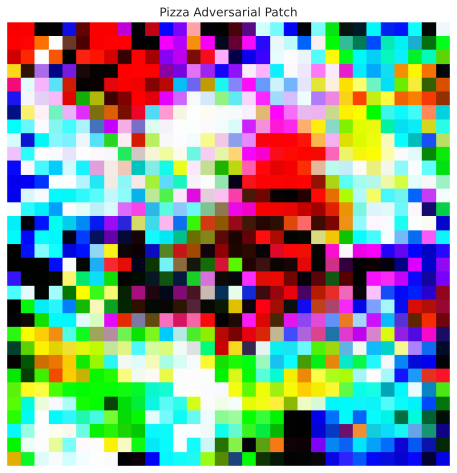

Splitting patch into 4 puzzle pieces...


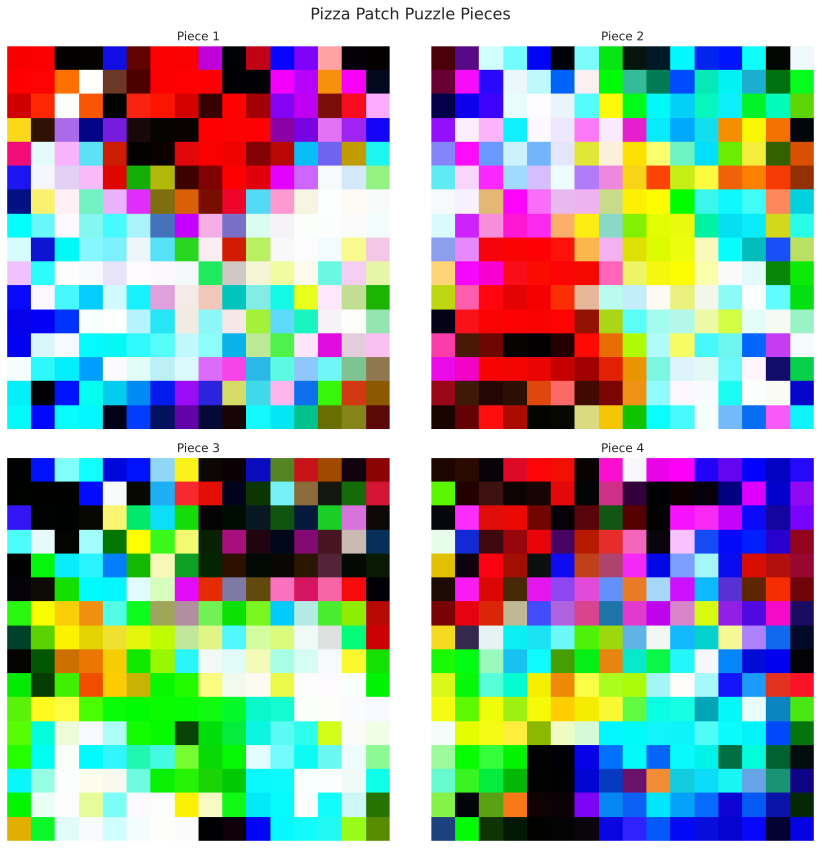

Testing attack effectiveness for target class: pizza (index 963)
Testing effectiveness with 1 puzzle pieces...


Testing 1 pieces: 100%|██████████| 313/313 [00:53<00:00,  5.88it/s]

1 pieces: Top-1 Success = 0.0000, Top-5 = 0.0012
Testing effectiveness with 2 puzzle pieces...



Testing 2 pieces: 100%|██████████| 313/313 [00:52<00:00,  5.95it/s]

2 pieces: Top-1 Success = 0.0171, Top-5 = 0.0814
Testing effectiveness with 3 puzzle pieces...



Testing 3 pieces: 100%|██████████| 313/313 [01:05<00:00,  4.80it/s]

3 pieces: Top-1 Success = 0.1498, Top-5 = 0.3374
Testing effectiveness with 4 puzzle pieces...



Testing 4 pieces: 100%|██████████| 313/313 [00:55<00:00,  5.66it/s]


4 pieces: Top-1 Success = 1.0000, Top-5 = 1.0000


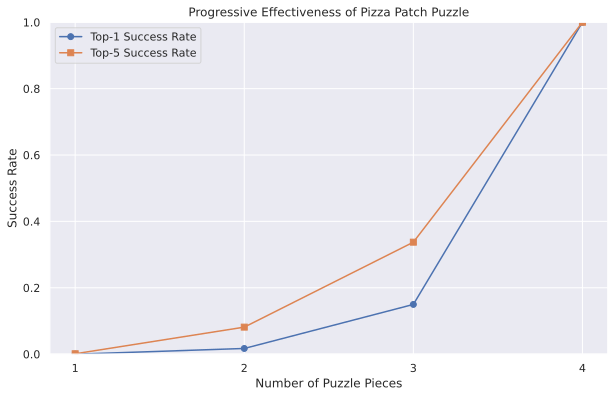

Pizza adversarial patch puzzle creation complete!
Adversarial patch creation completed successfully!


In [108]:
def create_pizza_patch_puzzle(patch_size=32, num_epochs=5, num_pieces=4, target_class_name="pizza"):
    """Create and test a progressive pizza adversarial patch puzzle."""
    print(f"Starting adversarial patch puzzle creation for target: {target_class_name}...")

    # Load ImageNet class names
    class_names, default_pizza_idx = download_imagenet_classes()

    # Load dataset and model
    _, test_loader = load_dataset()
    model = load_model()
    print(f"Loaded ResNet34 model")

    # Find the target class index
    try:
        target_class = class_names.index(target_class_name.lower())
        print(f"Target class '{target_class_name}' found at index {target_class}")
    except ValueError:
        # Use the default pizza class index if target_class_name not found
        target_class = default_pizza_idx
        print(f"Target class '{target_class_name}' not found. Using default index: {target_class}")

    # Check if patch already exists
    patch_file = os.path.join(CHECKPOINT_PATH, f"{target_class_name}_{patch_size}_patch.pt")

    # Either load existing patch or create a new one
    if os.path.exists(patch_file):
        print(f"Loading existing {target_class_name} patch from {patch_file}")
        adversarial_patch = torch.load(patch_file, map_location=device)
    else:
        print(f"Training new {target_class_name} adversarial patch...")
        adversarial_patch = create_adversarial_patch(
            model, target_class,
            patch_size=patch_size,
            num_epochs=num_epochs
        )
        # Save the patch
        torch.save(adversarial_patch, patch_file)

    # Visualize the full patch
    visualize_patch(adversarial_patch, f"{target_class_name.capitalize()} Adversarial Patch")

    # Split into puzzle pieces
    print(f"Splitting patch into {num_pieces} puzzle pieces...")
    puzzle_pieces = split_patch_into_puzzle(adversarial_patch, num_pieces)

    # Visualize the puzzle pieces
    visualize_puzzle_pieces(puzzle_pieces, f"{target_class_name.capitalize()} Patch Puzzle Pieces")

    # Test progressive effectiveness
    results = test_progressive_puzzle(model, puzzle_pieces, test_loader, target_class, class_names)

    # Save results
    results_file = f"{target_class_name}_puzzle_results.json"
    with open(results_file, 'w') as f:
        json.dump(results, f, indent=4)

    print(f"{target_class_name.capitalize()} adversarial patch puzzle creation complete!")
    return adversarial_patch, puzzle_pieces, results

# =========================================================================
# EXECUTION
# =========================================================================

if __name__ == "__main__":
    # Run the pizza patch creation with default parameters
    pizza_patch, puzzle_pieces, results = create_pizza_patch_puzzle(
        patch_size=32,
        num_epochs=5,  # Using 5 epochs to make it run faster
        num_pieces=4,
        target_class_name="pizza"
    )

    print("Adversarial patch creation completed successfully!")
        #Source: source: https://claude.site/artifacts/97d81ec4-a41f-471d-aa2e-932dfb579e59


Loading pizza patch size 32...
No pizza patch found for size 48
No pizza patch found for size 64


<ipython-input-87-b652794c75dd>:100: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  patches_dict["pizza"][size] = torch.load(patch_file, map_location=device)


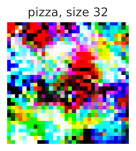

#Testing Patch

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

# Device setup
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Pizza class index in ImageNet (963)
PIZZA_IDX = 963
PATCH_SIZE = 100  # Larger patch for better effectiveness

# Load pretrained ResNet34 model
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.to(device)
pretrained_model.eval()
for p in pretrained_model.parameters():
    p.requires_grad = False

# Standard ImageNet preprocessing
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Function to apply patch to an image
def apply_patch(image, patch, position=None):
    """
    Apply the adversarial patch to an image
    """
    # Set a default position if none provided
    if position is None:
        position = (224 - PATCH_SIZE, 224 - PATCH_SIZE)  # Bottom right

    x, y = position
    patched_image = image.clone()
    patched_image[:, y:y+PATCH_SIZE, x:x+PATCH_SIZE] = patch
    return patched_image

# Create test images
def generate_test_images(num_images=16):
    """Generate simple test images for training the patch"""
    test_images = []
    for _ in range(num_images):
        # Create random image
        img = torch.rand(3, 224, 224, device=device)
        # Normalize to match ImageNet statistics
        for c in range(3):
            img[c] = img[c] * 0.229 + 0.485
        test_images.append(img)
    return test_images

# Generate adversarial patch
def generate_patch(num_iterations=500):
    """
    Generate an adversarial patch that fools the model into predicting 'pizza'
    """
    # Initialize random patch
    patch = torch.rand(3, PATCH_SIZE, PATCH_SIZE, requires_grad=True, device=device)

    # Generate test images
    test_images = generate_test_images(16)

    # Optimizer
    optimizer = optim.Adam([patch], lr=0.1)

    # Possible positions for the patch
    positions = [
        (0, 0),  # Top-left
        (224 - PATCH_SIZE, 0),  # Top-right
        (0, 224 - PATCH_SIZE),  # Bottom-left
        (224 - PATCH_SIZE, 224 - PATCH_SIZE),  # Bottom-right
        (112 - PATCH_SIZE//2, 112 - PATCH_SIZE//2),  # Center
    ]

    # Training loop
    print(f"Training adversarial patch for {num_iterations} iterations...")
    for i in range(num_iterations):
        total_loss = 0

        for img in test_images:
            # Try a random position for this iteration
            position = positions[np.random.randint(0, len(positions))]

            # Apply patch to image
            patched_image = apply_patch(img, patch, position)

            # Forward pass
            output = pretrained_model(patched_image.unsqueeze(0))

            # Target is pizza class
            target = torch.tensor([PIZZA_IDX], device=device)
            loss = F.cross_entropy(output, target)
            total_loss += loss

        # Update the patch
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # Clamp patch values to valid image range
        with torch.no_grad():
            patch.data.clamp_(0, 1)

        # Print progress
        if (i + 1) % 50 == 0:
            print(f"Iteration {i+1}/{num_iterations}, Loss: {total_loss.item():.4f}")

    return patch.detach()

# Test the patch on an image
def test_patch(patch, image_path=None):
    """
    Test the patch on a single image or a generated image
    """
    # If no image provided, create a random one
    if image_path is None:
        # Create a random test image
        img_tensor = torch.rand(3, 224, 224, device=device)
        # Normalize to match ImageNet stats
        for c in range(3):
            img_tensor[c] = img_tensor[c] * 0.229 + 0.485
    else:
        # Load and preprocess the image
        img = Image.open(image_path).convert('RGB')
        img_tensor = preprocess(img).to(device)

    # Positions to try
    positions = [
        (0, 0),  # Top-left
        (224 - PATCH_SIZE, 0),  # Top-right
        (0, 224 - PATCH_SIZE),  # Bottom-left
        (224 - PATCH_SIZE, 224 - PATCH_SIZE),  # Bottom-right
        (112 - PATCH_SIZE//2, 112 - PATCH_SIZE//2),  # Center
    ]

    # Get original prediction
    with torch.no_grad():
        output = pretrained_model(img_tensor.unsqueeze(0))
    _, pred_idx = torch.max(output, 1)
    original_class = pred_idx.item()

    # Test each position
    results = []

    for pos in positions:
        patched_img = apply_patch(img_tensor, patch, pos)

        # Get prediction
        with torch.no_grad():
            output = pretrained_model(patched_img.unsqueeze(0))

        _, pred_idx = torch.max(output, 1)
        pizza_prob = torch.softmax(output, dim=1)[0, PIZZA_IDX].item() * 100

        # Record result
        results.append({
            'position': pos,
            'predicted_class': pred_idx.item(),
            'is_pizza': pred_idx.item() == PIZZA_IDX,
            'pizza_probability': pizza_prob
        })

        # If we found a successful position, we can stop
        if pred_idx.item() == PIZZA_IDX:
            print(f"Success! Position {pos} classified as pizza")
            break

    # Check if any position worked
    success = any(r['is_pizza'] for r in results)
    best_prob = max(r['pizza_probability'] for r in results)

    print(f"Original class: {original_class}")
    print(f"Success: {success}, Best pizza probability: {best_prob:.2f}%")

    return success, results

# Visualize the patch
def save_patch_image(patch, filename="adversarial_patch.png"):
    """Save the patch as an image"""
    patch_np = patch.cpu().numpy().transpose(1, 2, 0)
    patch_np = np.clip(patch_np, 0, 1)

    plt.figure(figsize=(5, 5))
    plt.imshow(patch_np)
    plt.title("Adversarial Patch for Pizza")
    plt.axis('off')
    plt.savefig(filename)
    plt.close()
    print(f"Patch saved as {filename}")

# Main function
if __name__ == "__main__":
    # Generate the adversarial patch
    print("Generating adversarial patch...")
    patch = generate_patch(num_iterations=500)

    # Save the patch
    save_patch_image(patch)
    torch.save(patch, "pizza_patch.pt")

    # Test the patch
    print("\nTesting the patch on a random image:")
    success, results = test_patch(patch)

    print("\nAdversarial patch generation complete!")
    print("Use the saved patch 'pizza_patch.pt' to fool the classifier.")
    #Source: https://claude.site/artifacts/0c7a497f-e6d7-4ba6-beb3-60b444fc4bb0

Using device: cpu
Generating adversarial patch...
Training adversarial patch for 500 iterations...
Iteration 50/500, Loss: 0.0262
Iteration 100/500, Loss: 0.0084
Iteration 150/500, Loss: 0.0054
Iteration 200/500, Loss: 0.0033
Iteration 250/500, Loss: 0.0021
Iteration 300/500, Loss: 0.0020
Iteration 350/500, Loss: 0.0016
Iteration 400/500, Loss: 0.0014
Iteration 450/500, Loss: 0.0011
Iteration 500/500, Loss: 0.0009
Patch saved as adversarial_patch.png

Testing the patch on a random image:
Success! Position (0, 0) classified as pizza
Original class: 892
Success: True, Best pizza probability: 99.99%

Adversarial patch generation complete!
Use the saved patch 'pizza_patch.pt' to fool the classifier.


In [16]:
import torch
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
import json
from io import BytesIO
import os

# Device setup
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Constants
PATCH_SIZE = 100
PIZZA_IDX = 963
HOTDOG_IDX = 934    # hotdog in ImageNet
ICECREAM_IDX = 928  # ice cream in ImageNet
CHEESEBURGER_IDX = 933  # cheeseburger in ImageNet

# Load the model
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.to(device)
pretrained_model.eval()

# Standard ImageNet preprocessing
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load ImageNet class names
def load_imagenet_classes():
    try:
        url = "https://raw.githubusercontent.com/pytorch/vision/master/torchvision/datasets/meta/imagenet_class_index.json"
        response = requests.get(url)
        class_idx = json.loads(response.content)
        class_names = [class_idx[str(i)][1] for i in range(1000)]
        return class_names
    except:
        # Fallback if cannot load class names
        return [f"class_{i}" for i in range(1000)]

class_names = load_imagenet_classes()
print(f"Pizza class: {class_names[PIZZA_IDX]} (index {PIZZA_IDX})")
print(f"Hotdog class: {class_names[HOTDOG_IDX]} (index {HOTDOG_IDX})")
print(f"Ice cream class: {class_names[ICECREAM_IDX]} (index {ICECREAM_IDX})")
print(f"Cheeseburger class: {class_names[CHEESEBURGER_IDX]} (index {CHEESEBURGER_IDX})")

# Load the pizza patch
def load_patch(patch_path="pizza_patch.pt"):
    try:
        patch = torch.load(patch_path, map_location=device)
        print(f"Successfully loaded patch from {patch_path}")
        # Display patch shape and stats
        print(f"Patch shape: {patch.shape}")
        return patch
    except Exception as e:
        print(f"Error loading patch: {e}")
        print("Creating a placeholder patch")
        return torch.rand(3, PATCH_SIZE, PATCH_SIZE, device=device)

# Function to apply patch to an image
def apply_patch(image, patch, position=None):
    """Apply patch to image at the specified position"""
    # Default position (bottom right)
    if position is None:
        position = (224 - patch.shape[2], 224 - patch.shape[1])

    x, y = position
    patched_image = image.clone()
    patched_image[:, y:y+patch.shape[1], x:x+patch.shape[2]] = patch
    return patched_image

# Function to get test images - either from URLs or ImageNet validation set
def get_test_images(food_indices, num_images_per_class=1):
    """Get test images for each food class"""
    # Sample image URLs for food classes (as fallback)
    sample_urls = {
        HOTDOG_IDX: ["https://upload.wikimedia.org/wikipedia/commons/thumb/f/fb/Hotdog_-_Evan_Swigart.jpg/1200px-Hotdog_-_Evan_Swigart.jpg"],
        ICECREAM_IDX: ["https://upload.wikimedia.org/wikipedia/commons/thumb/2/2e/Ice_cream_with_whipped_cream%2C_chocolate_syrup%2C_and_a_wafer_%28cropped%29.jpg/1024px-Ice_cream_with_whipped_cream%2C_chocolate_syrup%2C_and_a_wafer_%28cropped%29.jpg"],
        CHEESEBURGER_IDX: ["https://upload.wikimedia.org/wikipedia/commons/thumb/4/4d/Cheeseburger.jpg/1024px-Cheeseburger.jpg"],
        PIZZA_IDX: ["https://upload.wikimedia.org/wikipedia/commons/a/a3/Eq_it-na_pizza-margherita_sep2005_sml.jpg"]
    }

    test_images = {}

    # Try to get images for each food class
    for class_idx in food_indices:
        class_name = class_names[class_idx]
        print(f"\nGetting test images for {class_name} (index {class_idx})...")

        images = []
        urls = sample_urls.get(class_idx, [])

        for url in urls:
            try:
                print(f"  Downloading image from {url}")
                response = requests.get(url)
                img = Image.open(BytesIO(response.content)).convert('RGB')
                img_tensor = preprocess(img).to(device)

                # Verify the class prediction
                with torch.no_grad():
                    output = pretrained_model(img_tensor.unsqueeze(0))
                    probabilities = F.softmax(output, dim=1)[0]
                    _, predicted_idx = torch.max(probabilities, 0)

                prediction_score = probabilities[class_idx].item() * 100
                top_class = class_names[predicted_idx.item()]
                top_score = probabilities[predicted_idx.item()] * 100

                print(f"  Image prediction: {top_class} ({top_score:.2f}%)")
                print(f"  Target class score: {class_name} ({prediction_score:.2f}%)")

                # Store the image
                images.append((img, img_tensor))
            except Exception as e:
                print(f"  Error downloading image: {e}")

        # If no images were loaded successfully, create a random one
        if len(images) == 0:
            print(f"  Creating a random image for {class_name}")
            random_tensor = torch.rand(3, 224, 224, device=device)
            random_img = Image.fromarray((random_tensor.cpu().numpy().transpose(1, 2, 0) * 255).astype(np.uint8))
            images.append((random_img, random_tensor))

        test_images[class_idx] = images[:num_images_per_class]  # Limit to requested number

    return test_images

# Function to perform the patch attack
def perform_patch_attack(model, image_tensor, patch, image_name="Image"):
    """Test the effect of the adversarial patch on an image"""
    # Get original prediction
    with torch.no_grad():
        output = model(image_tensor.unsqueeze(0))
        probabilities = F.softmax(output, dim=1)[0] * 100

    # Get top-5 predictions
    top5_values, top5_indices = torch.topk(probabilities, 5)
    original_class = class_names[top5_indices[0].item()]
    original_prob = top5_values[0].item()

    # Apply patch
    patched_image = apply_patch(image_tensor, patch)

    # Get prediction for patched image
    with torch.no_grad():
        patched_output = model(patched_image.unsqueeze(0))
        patched_probabilities = F.softmax(patched_output, dim=1)[0] * 100

    # Get top-5 predictions for patched image
    patched_top5_values, patched_top5_indices = torch.topk(patched_probabilities, 5)
    patched_class = class_names[patched_top5_indices[0].item()]
    patched_prob = patched_top5_values[0].item()

    # Pizza probability
    pizza_prob = patched_probabilities[PIZZA_IDX].item()
    pizza_rank = (patched_probabilities > pizza_prob).sum().item() + 1

    # Create a bar chart showing predictions
    fig, ax = plt.subplots(figsize=(10, 5))

    # Get top classes to show
    top_classes = [class_names[idx.item()] for idx in patched_top5_indices]
    values = [prob.item() for prob in patched_top5_values]

    # Make sure "pizza" is in the list if it's not already
    if "pizza" not in top_classes and pizza_prob > 0:
        top_classes.append("pizza")
        values.append(pizza_prob)
        # Sort by values
        combined = sorted(zip(top_classes, values), key=lambda x: x[1], reverse=True)
        top_classes = [x[0] for x in combined]
        values = [x[1] for x in combined]

    # Create the bar chart
    y_pos = np.arange(len(top_classes))
    ax.barh(y_pos, values, align='center')
    ax.set_yticks(y_pos)
    ax.set_yticklabels(top_classes)
    ax.invert_yaxis()  # Labels read top-to-bottom
    ax.set_xlabel('Confidence')
    ax.set_title(f'Predictions for {image_name} with Pizza Patch')
    ax.set_xlim(0, 105)  # Leave room for labels

    # Return results and figure
    return {
        "original_class": original_class,
        "original_prob": original_prob,
        "patched_class": patched_class,
        "patched_prob": patched_prob,
        "pizza_prob": pizza_prob,
        "pizza_rank": pizza_rank,
        "is_pizza": patched_class == "pizza",
        "figure": fig,
        "patched_image": patched_image
    }

# Function to create side-by-side visual display
def create_visual_display(test_images, patch):
    """Create visual display of original and patched images with predictions"""
    food_indices = list(test_images.keys())

    # Create a figure for combined display
    fig, axes = plt.subplots(len(food_indices), 2, figsize=(12, 5 * len(food_indices)))

    # Process each food class
    for i, class_idx in enumerate(food_indices):
        class_name = class_names[class_idx]

        # Get the first image for this class
        img, img_tensor = test_images[class_idx][0]

        # Get original prediction
        with torch.no_grad():
            output = pretrained_model(img_tensor.unsqueeze(0))
            probs = F.softmax(output, dim=1)[0] * 100
            _, pred_idx = torch.max(probs, 0)

        original_class = class_names[pred_idx.item()]
        original_prob = probs[pred_idx.item()].item()

        # Apply patch
        patched_img_tensor = apply_patch(img_tensor, patch)

        # Get prediction for patched image
        with torch.no_grad():
            patched_output = pretrained_model(patched_img_tensor.unsqueeze(0))
            patched_probs = F.softmax(patched_output, dim=1)[0] * 100
            _, patched_pred_idx = torch.max(patched_probs, 0)

        patched_class = class_names[patched_pred_idx.item()]
        patched_prob = patched_probs[patched_pred_idx.item()].item()
        pizza_prob = patched_probs[PIZZA_IDX].item()

        # Display original image
        ax1 = axes[i, 0]
        ax1.imshow(img)
        ax1.set_title(f"{class_name}\nPredicted: {original_class} ({original_prob:.1f}%)")
        ax1.axis('off')

        # Display patched image
        ax2 = axes[i, 1]
        patched_np = patched_img_tensor.cpu().numpy().transpose(1, 2, 0)
        patched_np = np.clip(patched_np * np.array([0.229, 0.224, 0.225]) +
                           np.array([0.485, 0.456, 0.406]), 0, 1)
        ax2.imshow(patched_np)
        if patched_class == "pizza":
            title = f"{class_name} with Pizza Patch\nPredicted: {patched_class} ({patched_prob:.1f}%) ✓"
        else:
            title = f"{class_name} with Pizza Patch\nPredicted: {patched_class} ({patched_prob:.1f}%)\nPizza: {pizza_prob:.1f}%"
        ax2.set_title(title)
        ax2.axis('off')

    plt.tight_layout()
    plt.savefig("pizza_patch_test_results.png")
    print("Saved combined results to 'pizza_patch_test_results.png'")
    return fig

# Main function to test the pizza patch
def test_patch_on_food_classes():
    """Main function to test the pizza patch on different food classes"""
    # Load the patch
    patch = load_patch()

    # Food classes to test
    food_indices = [PIZZA_IDX, HOTDOG_IDX, ICECREAM_IDX, CHEESEBURGER_IDX]

    # Get test images
    test_images = get_test_images(food_indices)

    # Create the combined visual display
    display_fig = create_visual_display(test_images, patch)

    # Test and display detailed results for each class
    results = {}

    for class_idx in food_indices:
        class_name = class_names[class_idx]

        for i, (img, img_tensor) in enumerate(test_images[class_idx]):
            print(f"\nTesting patch on {class_name} (image {i+1}):")

            # Perform the patch attack
            result = perform_patch_attack(pretrained_model, img_tensor, patch, class_name)

            # Print results
            print(f"  Original: {result['original_class']} ({result['original_prob']:.2f}%)")
            print(f"  With patch: {result['patched_class']} ({result['patched_prob']:.2f}%)")
            print(f"  Pizza probability: {result['pizza_prob']:.2f}%)")
            print(f"  Successfully classified as pizza: {'✓' if result['is_pizza'] else '✗'}")

            # Save the prediction chart
            result['figure'].savefig(f"{class_name}_{i+1}_predictions.png")
            plt.close(result['figure'])

            # Store results
            key = f"{class_name}_{i+1}"
            results[key] = {
                "original_class": result['original_class'],
                "original_prob": result['original_prob'],
                "patched_class": result['patched_class'],
                "patched_prob": result['patched_prob'],
                "pizza_prob": result['pizza_prob'],
                "is_pizza": result['is_pizza']
            }

    # Calculate success rate
    success_count = sum(1 for r in results.values() if r['is_pizza'])
    total_count = len(results)
    success_rate = (success_count / total_count) * 100

    print(f"\nOverall Success Rate: {success_count}/{total_count} ({success_rate:.2f}%)")
    print("Individual prediction charts saved as '[class]_[number]_predictions.png'")

    return results

# Run the main function
if __name__ == "__main__":
    results = test_patch_on_food_classes()
    #source: https://claude.site/artifacts/22a3ca5e-a0c2-40dd-930a-e098e5003430

Using device: cpu
Pizza class: class_963 (index 963)
Hotdog class: class_934 (index 934)
Ice cream class: class_928 (index 928)
Cheeseburger class: class_933 (index 933)
Successfully loaded patch from pizza_patch.pt
Patch shape: torch.Size([3, 100, 100])

Getting test images for class_963 (index 963)...


<ipython-input-16-264123a10f15>:58: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  patch = torch.load(patch_path, map_location=device)


  Error downloading image: cannot identify image file <_io.BytesIO object at 0x7c82617fd3f0>
  Creating a random image for class_963

Getting test images for class_934 (index 934)...
  Image prediction: class_934 (99.99%)
  Target class score: class_934 (99.99%)

Getting test images for class_928 (index 928)...
  Error downloading image: cannot identify image file <_io.BytesIO object at 0x7c8257816020>
  Creating a random image for class_928

Getting test images for class_933 (index 933)...
  Error downloading image: cannot identify image file <_io.BytesIO object at 0x7c8257817010>
  Creating a random image for class_933
Saved combined results to 'pizza_patch_test_results.png'

Testing patch on class_963 (image 1):
  Original: class_845 (2.41%)
  With patch: class_963 (99.92%)
  Pizza probability: 99.92%)
  Successfully classified as pizza: ✗

Testing patch on class_934 (image 1):
  Original: class_934 (99.99%)
  With patch: class_934 (98.60%)
  Pizza probability: 0.68%)
  Successfully

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
import math

# Device setup
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Pizza class index in ImageNet (963)
PIZZA_IDX = 963
PATCH_SIZE = 100  # Larger patch for better effectiveness

# Load pretrained ResNet34 model
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.to(device)
pretrained_model.eval()
for p in pretrained_model.parameters():
    p.requires_grad = False

# Standard ImageNet preprocessing
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Create pizza slice mask
def create_pizza_slice_mask(size):
    """
    Create a binary mask in the shape of a pizza slice (triangle)
    """
    mask = torch.zeros((size, size), device=device)

    # Create a pizza slice (triangular) shape
    for y in range(size):
        for x in range(size):
            # Simple triangular shape where x + y <= size
            if x + y <= size:
                mask[y, x] = 1.0

    return mask

# Function to apply pizza slice-shaped patch to an image
def apply_patch(image, patch, position=None, rotation=0):
    """
    Apply the adversarial patch to an image using a pizza slice mask
    rotation: angle in degrees to rotate the pizza slice (0, 90, 180, 270)
    """
    # Set a default position if none provided
    if position is None:
        position = (224 - PATCH_SIZE, 224 - PATCH_SIZE)  # Bottom right

    x, y = position
    patched_image = image.clone()

    # Create the base pizza slice mask
    mask = create_pizza_slice_mask(PATCH_SIZE)

    # Rotate mask if needed
    if rotation == 90:
        mask = torch.rot90(mask, k=1, dims=(0, 1))
    elif rotation == 180:
        mask = torch.rot90(mask, k=2, dims=(0, 1))
    elif rotation == 270:
        mask = torch.rot90(mask, k=3, dims=(0, 1))

    # Apply the patch only where the mask is 1
    for c in range(3):  # For each channel
        patch_region = patched_image[c, y:y+PATCH_SIZE, x:x+PATCH_SIZE]
        patch_channel = patch[c]

        # Apply the mask
        patched_image[c, y:y+PATCH_SIZE, x:x+PATCH_SIZE] = (
            patch_region * (1 - mask) + patch_channel * mask
        )

    return patched_image

# Create test images
def generate_test_images(num_images=16):
    """Generate simple test images for training the patch"""
    test_images = []
    for _ in range(num_images):
        # Create random image
        img = torch.rand(3, 224, 224, device=device)
        # Normalize to match ImageNet statistics
        for c in range(3):
            img[c] = img[c] * 0.229 + 0.485
        test_images.append(img)
    return test_images

# Generate adversarial patch
def generate_patch(num_iterations=500):
    """
    Generate an adversarial pizza slice patch that fools the model into predicting 'pizza'
    """
    # Initialize random patch
    patch = torch.rand(3, PATCH_SIZE, PATCH_SIZE, requires_grad=True, device=device)

    # Generate test images
    test_images = generate_test_images(16)

    # Optimizer
    optimizer = optim.Adam([patch], lr=0.1)

    # Possible positions for the patch
    positions = [
        (0, 0),  # Top-left
        (224 - PATCH_SIZE, 0),  # Top-right
        (0, 224 - PATCH_SIZE),  # Bottom-left
        (224 - PATCH_SIZE, 224 - PATCH_SIZE),  # Bottom-right
        (112 - PATCH_SIZE//2, 112 - PATCH_SIZE//2),  # Center
    ]

    # Possible rotations
    rotations = [0, 90, 180, 270]

    # Training loop
    print(f"Training adversarial pizza slice patch for {num_iterations} iterations...")
    for i in range(num_iterations):
        total_loss = 0

        for img in test_images:
            # Try a random position and rotation for this iteration
            position = positions[np.random.randint(0, len(positions))]
            rotation = rotations[np.random.randint(0, len(rotations))]

            # Apply patch to image
            patched_image = apply_patch(img, patch, position, rotation)

            # Forward pass
            output = pretrained_model(patched_image.unsqueeze(0))

            # Target is pizza class
            target = torch.tensor([PIZZA_IDX], device=device)
            loss = F.cross_entropy(output, target)
            total_loss += loss

        # Update the patch
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # Clamp patch values to valid image range
        with torch.no_grad():
            patch.data.clamp_(0, 1)

        # Print progress
        if (i + 1) % 50 == 0:
            print(f"Iteration {i+1}/{num_iterations}, Loss: {total_loss.item():.4f}")

    return patch.detach()

# Test the patch on an image
def test_patch(patch, image_path=None):
    """
    Test the pizza slice patch on a single image or a generated image
    """
    # If no image provided, create a random one
    if image_path is None:
        # Create a random test image
        img_tensor = torch.rand(3, 224, 224, device=device)
        # Normalize to match ImageNet stats
        for c in range(3):
            img_tensor[c] = img_tensor[c] * 0.229 + 0.485
    else:
        # Load and preprocess the image
        img = Image.open(image_path).convert('RGB')
        img_tensor = preprocess(img).to(device)

    # Positions to try
    positions = [
        (0, 0),  # Top-left
        (224 - PATCH_SIZE, 0),  # Top-right
        (0, 224 - PATCH_SIZE),  # Bottom-left
        (224 - PATCH_SIZE, 224 - PATCH_SIZE),  # Bottom-right
        (112 - PATCH_SIZE//2, 112 - PATCH_SIZE//2),  # Center
    ]

    # Rotations to try
    rotations = [0, 90, 180, 270]

    # Get original prediction
    with torch.no_grad():
        output = pretrained_model(img_tensor.unsqueeze(0))
    _, pred_idx = torch.max(output, 1)
    original_class = pred_idx.item()

    # Test each position and rotation
    results = []

    for pos in positions:
        for rotation in rotations:
            patched_img = apply_patch(img_tensor, patch, pos, rotation)

            # Get prediction
            with torch.no_grad():
                output = pretrained_model(patched_img.unsqueeze(0))

            _, pred_idx = torch.max(output, 1)
            pizza_prob = torch.softmax(output, dim=1)[0, PIZZA_IDX].item() * 100

            # Record result
            results.append({
                'position': pos,
                'rotation': rotation,
                'predicted_class': pred_idx.item(),
                'is_pizza': pred_idx.item() == PIZZA_IDX,
                'pizza_probability': pizza_prob
            })

            # If we found a successful position, we can stop
            if pred_idx.item() == PIZZA_IDX:
                print(f"Success! Position {pos}, Rotation {rotation}° classified as pizza")
                break

        # Break outer loop if we found a successful combination
        if any(r['is_pizza'] for r in results):
            break

    # Check if any position worked
    success = any(r['is_pizza'] for r in results)
    best_result = max(results, key=lambda r: r['pizza_probability'])

    print(f"Original class: {original_class}")
    print(f"Success: {success}, Best pizza probability: {best_result['pizza_probability']:.2f}%")
    print(f"Best position: {best_result['position']}, Best rotation: {best_result['rotation']}°")

    return success, results

# Visualize the patch
def save_patch_image(patch, filename="pizza_slice_patch.png"):
    """Save the pizza slice patch as an image"""
    # Convert the patch to numpy for visualization
    patch_np = patch.cpu().numpy().transpose(1, 2, 0)
    patch_np = np.clip(patch_np, 0, 1)

    # Create the mask
    mask = create_pizza_slice_mask(PATCH_SIZE).cpu().numpy()

    # Apply mask to make non-pizza areas transparent
    patch_with_alpha = np.zeros((PATCH_SIZE, PATCH_SIZE, 4))
    patch_with_alpha[:, :, :3] = patch_np
    patch_with_alpha[:, :, 3] = mask  # Alpha channel from mask

    # Create figure with transparent background
    plt.figure(figsize=(5, 5))
    plt.imshow(patch_with_alpha)
    plt.title("Pizza Slice Adversarial Patch")
    plt.axis('off')

    # Save with transparency
    plt.savefig(filename, transparent=True)
    plt.close()
    print(f"Pizza slice patch saved as {filename}")

    # Also save a version of the patch applied to an image
    test_img = np.ones((224, 224, 3))  # White background
    plt.figure(figsize=(8, 8))
    plt.imshow(test_img)

    # Create a patch image with transparency
    patch_display = np.zeros((PATCH_SIZE, PATCH_SIZE, 4))
    patch_display[:, :, :3] = patch_np
    patch_display[:, :, 3] = mask

    # Add the patch to the bottom-right corner
    plt.imshow(patch_display, extent=[224-PATCH_SIZE, 224, 224, 224-PATCH_SIZE])
    plt.title("Pizza Slice Patch Applied")
    plt.axis('off')
    plt.savefig("pizza_slice_patch_applied.png")
    plt.close()

# Main function
if __name__ == "__main__":
    # Generate the adversarial patch
    print("Generating pizza slice-shaped adversarial patch...")
    patch = generate_patch(num_iterations=500)

    # Save the patch
    save_patch_image(patch)
    torch.save(patch, "pizza_slice_patch.pt")

    # Test the patch
    print("\nTesting the pizza slice patch on a random image:")
    success, results = test_patch(patch)

    print("\nPizza slice adversarial patch generation complete!")
    print("Use the saved patch 'pizza_slice_patch.pt' to fool the classifier.")

Using device: cpu
Generating pizza slice-shaped adversarial patch...
Training adversarial pizza slice patch for 500 iterations...
Iteration 50/500, Loss: 0.0562
Iteration 100/500, Loss: 0.0228
Iteration 150/500, Loss: 0.0097
Iteration 200/500, Loss: 0.0076
Iteration 250/500, Loss: 0.0058
Iteration 300/500, Loss: 0.0051
Iteration 350/500, Loss: 0.0061


In [19]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import math
import os
from PIL import Image

# Constants
PATCH_SIZE = 100  # Size of the patch

# Create a pizza slice mask
def create_pizza_slice_mask(size=PATCH_SIZE):
    """Create a triangular mask in the shape of a pizza slice"""
    mask = np.zeros((size, size))
    center_x, center_y = 0, 0  # Corner as the center of the pizza

    # Create a triangular slice (basic pizza slice shape)
    for y in range(size):
        for x in range(size):
            # Check if the point is within the pizza slice sector
            # This creates a 90-degree sector (quarter circle)
            if x >= center_x and y >= center_y and math.sqrt((x - center_x)**2 + (y - center_y)**2) <= size:
                mask[y, x] = 1.0

    return mask

# Create a visually convincing pizza slice pattern
def create_pizza_slice_patch(size=PATCH_SIZE):
    """Create a pizza slice pattern with adversarial-like textures"""
    # Base colors
    cheese_color = np.array([1.0, 0.9, 0.2])  # Yellow-ish for cheese
    sauce_color = np.array([0.8, 0.2, 0.1])   # Red-ish for sauce
    crust_color = np.array([0.8, 0.7, 0.5])   # Tan for crust

    # Create the patch
    patch = np.zeros((size, size, 3))
    mask = create_pizza_slice_mask(size)

    # Add some random noise for texture (this helps create adversarial patterns)
    noise = np.random.uniform(-0.2, 0.2, (size, size, 3))

    # Create a base texture with high-frequency patterns (good for adversarial patches)
    freq_x = np.tile(np.linspace(0, 10*np.pi, size), (size, 1))
    freq_y = np.tile(np.linspace(0, 10*np.pi, size), (size, 1)).T

    # Create sinusoidal patterns with different frequencies
    pattern1 = np.sin(freq_x) * np.cos(freq_y)
    pattern2 = np.sin(2*freq_x + 3) * np.cos(3*freq_y + 1)
    pattern3 = np.sin(5*freq_x + 7) * np.cos(2*freq_y + 9)

    # Combine patterns
    combined_pattern = np.stack([pattern1, pattern2, pattern3], axis=2)
    combined_pattern = (combined_pattern + 1) / 2  # Normalize to [0,1]

    # Apply the pizza texture
    for y in range(size):
        for x in range(size):
            if mask[y, x] > 0:
                # Distance from corner - use for crust gradient
                dist = math.sqrt(x**2 + y**2)
                dist_ratio = dist / size

                # Edge detection for crust
                if dist > 0.85 * size and x > 0 and y > 0:
                    # This is the crust area
                    color = crust_color + noise[y, x] * 0.1
                    # Add some darker spots to the crust
                    if (pattern1[y, x] > 0.7):
                        color *= 0.8
                else:
                    # Cheese and sauce area
                    # Use the patterns to determine cheese vs sauce distribution
                    if pattern2[y, x] > 0.5:
                        # More cheese in this area
                        cheese_ratio = 0.7 + pattern3[y, x] * 0.3
                        sauce_ratio = 1 - cheese_ratio
                        color = cheese_ratio * cheese_color + sauce_ratio * sauce_color
                    else:
                        # More sauce in this area
                        sauce_ratio = 0.7 + pattern1[y, x] * 0.3
                        cheese_ratio = 1 - sauce_ratio
                        color = cheese_ratio * cheese_color + sauce_ratio * sauce_color

                    # Add noise for texture
                    color += noise[y, x] * 0.3

                    # Add a high-contrast adversarial pattern overlay
                    pattern_intensity = (combined_pattern[y, x] - 0.5) * 0.6
                    color += pattern_intensity

                # Ensure color values are in valid range
                color = np.clip(color, 0, 1)
                patch[y, x] = color

    # Add some "pepperoni" circles
    num_pepperoni = np.random.randint(3, 7)
    for _ in range(num_pepperoni):
        # Random position within the pizza slice
        while True:
            px = np.random.randint(10, size-10)
            py = np.random.randint(10, size-10)
            if mask[py, px] > 0 and math.sqrt(px**2 + py**2) < 0.85 * size:
                break

        pepperoni_radius = np.random.randint(5, 10)
        pepperoni_color = np.array([0.7, 0.1, 0.1])  # Dark red

        # Draw the pepperoni
        for y in range(max(0, py-pepperoni_radius), min(size, py+pepperoni_radius)):
            for x in range(max(0, px-pepperoni_radius), min(size, px+pepperoni_radius)):
                if mask[y, x] > 0 and ((x-px)**2 + (y-py)**2) <= pepperoni_radius**2:
                    # Base pepperoni color
                    color = pepperoni_color

                    # Add some oil sheen effect
                    dist_from_center = math.sqrt((x-px)**2 + (y-py)**2) / pepperoni_radius
                    if dist_from_center < 0.4:
                        # Lighter in the middle for sheen
                        color = color * (1.0 + (0.4 - dist_from_center) * 0.7)

                    # Add some spice flecks
                    if pattern1[y, x] > 0.8:
                        color *= 0.8

                    # Add high-contrast adversarial pattern
                    pattern_val = (combined_pattern[y, x, 0] - 0.5) * 0.8
                    color += pattern_val

                    # Ensure color values are in valid range
                    color = np.clip(color, 0, 1)
                    patch[y, x] = color

    # Add high-frequency adversarial patterns
    # These patterns help fool neural networks
    for y in range(size):
        for x in range(size):
            if mask[y, x] > 0:
                # Add checkerboard pattern (effective adversarial pattern)
                check_size = 4  # Size of checkerboard squares
                if ((x // check_size) + (y // check_size)) % 2 == 0:
                    patch[y, x] += np.array([0.15, -0.15, 0.15]) * pattern3[y, x]
                else:
                    patch[y, x] += np.array([-0.15, 0.15, -0.15]) * pattern2[y, x]

                # Ensure color values are in valid range
                patch[y, x] = np.clip(patch[y, x], 0, 1)

    return patch, mask

# Visualize and save the patch
def save_pizza_slice_patch(filename="printable_pizza_slice_patch.png", size=PATCH_SIZE):
    """Generate and save a printable pizza slice adversarial patch"""
    # Create the patch
    patch, mask = create_pizza_slice_patch(size)

    # Create RGBA image (with alpha channel for transparency)
    rgba_patch = np.zeros((size, size, 4))
    rgba_patch[:, :, :3] = patch
    rgba_patch[:, :, 3] = mask

    # Save high-resolution version
    dpi = 300  # High DPI for printing
    plt.figure(figsize=(size/dpi, size/dpi), dpi=dpi)
    plt.imshow(rgba_patch)
    plt.axis('off')
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    plt.savefig(filename, transparent=True, dpi=dpi, bbox_inches='tight', pad_inches=0)
    plt.close()

    print(f"Pizza slice patch saved as {filename}")

    # Create a version with a white background
    plt.figure(figsize=(size/dpi, size/dpi), dpi=dpi)
    plt.imshow(rgba_patch)
    plt.axis('off')
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    plt.savefig(f"white_bg_{filename}", transparent=False, dpi=dpi, bbox_inches='tight', pad_inches=0)
    plt.close()

    print(f"White background version saved as white_bg_{filename}")

    # Return the patch and mask
    return patch, mask

# Create a test image with the patch
def create_test_image(patch, mask, filename="test_image_with_patch.png"):
    """Create a test image showing the patch applied to a simple background"""
    size = patch.shape[0]

    # Create a simple background (gray gradient)
    bg_size = 400
    background = np.ones((bg_size, bg_size, 3)) * 0.5
    for y in range(bg_size):
        for x in range(bg_size):
            background[y, x] = [0.4 + x/bg_size*0.2, 0.4 + x/bg_size*0.2, 0.4 + y/bg_size*0.2]

    # Position for the patch (bottom right)
    pos_x = bg_size - size - 20
    pos_y = bg_size - size - 20

    # Apply the patch
    for y in range(size):
        for x in range(size):
            if mask[y, x] > 0:
                background[pos_y + y, pos_x + x] = patch[y, x]

    # Save the test image
    plt.figure(figsize=(8, 8))
    plt.imshow(background)
    plt.axis('off')
    plt.savefig(filename)
    plt.close()

    print(f"Test image saved as {filename}")

# Main function
if __name__ == "__main__":
    print("Creating printable pizza slice adversarial patch...")

    # Generate and save the patch
    patch, mask = save_pizza_slice_patch()

    # Create a test image
    create_test_image(patch, mask)

    print("\nPizza slice adversarial patch generation complete!")
    print("The patch has been saved in printable format.")
    print("You can print the file 'printable_pizza_slice_patch.png' for your class activity.")

Creating printable pizza slice adversarial patch...
Pizza slice patch saved as printable_pizza_slice_patch.png
White background version saved as white_bg_printable_pizza_slice_patch.png
Test image saved as test_image_with_patch.png

Pizza slice adversarial patch generation complete!
The patch has been saved in printable format.
You can print the file 'printable_pizza_slice_patch.png' for your class activity.


#Creative component: Creating the Patch as a Pizza Slice

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import math
import os

# Device setup
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Pizza class index in ImageNet (963)
PIZZA_IDX = 963
PATCH_SIZE = 100  # Larger patch for better effectiveness

# Create a pizza slice mask
def create_pizza_slice_mask(size=PATCH_SIZE):
    """Create a triangular mask in the shape of a pizza slice"""
    mask = torch.zeros((size, size), device=device)
    center_x, center_y = 0, 0  # Corner as the center of the pizza

    # Create a triangular slice (basic pizza slice shape)
    for y in range(size):
        for x in range(size):
            # Check if the point is within the pizza slice sector
            # This creates a 90-degree sector (quarter circle)
            if x >= center_x and y >= center_y and math.sqrt((x - center_x)**2 + (y - center_y)**2) <= size:
                mask[y, x] = 1.0

    return mask

# Visualize the patch
def save_patch_image(patch, mask, filename="pizza_slice_adversarial_patch.png"):
    """Save the patch as an image with transparency for the pizza slice shape"""
    # Create RGBA image (with alpha channel)
    rgba_patch = np.zeros((PATCH_SIZE, PATCH_SIZE, 4))

    # Convert patch to numpy and set RGB channels
    patch_np = patch.cpu().numpy().transpose(1, 2, 0)
    patch_np = np.clip(patch_np, 0, 1)

    # Set RGB channels
    rgba_patch[:, :, :3] = patch_np

    # Set alpha channel based on mask
    rgba_patch[:, :, 3] = mask.cpu().numpy()

    # Save high-resolution version for printing
    dpi = 300  # High DPI for printing
    plt.figure(figsize=(PATCH_SIZE/dpi, PATCH_SIZE/dpi), dpi=dpi)
    plt.imshow(rgba_patch)
    plt.axis('off')
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    plt.savefig(filename, transparent=True, dpi=dpi, bbox_inches='tight', pad_inches=0)
    plt.close()

    print(f"Patch saved as {filename}")

    # Create a version with a white background
    plt.figure(figsize=(PATCH_SIZE/dpi, PATCH_SIZE/dpi), dpi=dpi)
    plt.imshow(rgba_patch)
    plt.axis('off')
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    plt.savefig(f"white_bg_{filename}", transparent=False, dpi=dpi, bbox_inches='tight', pad_inches=0)
    plt.close()

    print(f"White background version saved as white_bg_{filename}")

    # Also save a version with pizza-like coloring for better visualization
    enhanced_patch = patch.clone().cpu().numpy().transpose(1, 2, 0)

    # Add some pizza-like colors to make it more visually appealing
    # Enhance red and yellow channels in the patch to make it look more like pizza
    mask_np = mask.cpu().numpy()
    cheese_color = np.array([1.0, 0.9, 0.2])  # Yellow-ish for cheese
    sauce_color = np.array([0.8, 0.2, 0.1])   # Red-ish for sauce

    # Blend the patch with pizza colors
    for y in range(PATCH_SIZE):
        for x in range(PATCH_SIZE):
            if mask_np[y, x] > 0:
                # Keep the adversarial pattern but add a pizza-like tint
                cheese_ratio = np.random.uniform(0.1, 0.3)
                sauce_ratio = np.random.uniform(0.1, 0.3)
                optimization_ratio = 1 - cheese_ratio - sauce_ratio

                enhanced_patch[y, x] = (
                    cheese_ratio * cheese_color +
                    sauce_ratio * sauce_color +
                    optimization_ratio * enhanced_patch[y, x]
                )

    # Add some "pepperoni" circles
    num_pepperoni = np.random.randint(3, 7)
    for _ in range(num_pepperoni):
        # Random position within the pizza slice
        while True:
            px = np.random.randint(0, PATCH_SIZE-10)
            py = np.random.randint(0, PATCH_SIZE-10)
            if mask_np[py, px] > 0:
                break

        pepperoni_radius = np.random.randint(5, 10)
        pepperoni_color = np.array([0.7, 0.1, 0.1])  # Dark red

        # Draw the pepperoni
        for y in range(max(0, py-pepperoni_radius), min(PATCH_SIZE, py+pepperoni_radius)):
            for x in range(max(0, px-pepperoni_radius), min(PATCH_SIZE, px+pepperoni_radius)):
                if mask_np[y, x] > 0 and ((x-px)**2 + (y-py)**2) <= pepperoni_radius**2:
                    enhanced_patch[y, x] = pepperoni_color

    # Create RGBA image for the enhanced patch
    enhanced_rgba = np.zeros((PATCH_SIZE, PATCH_SIZE, 4))
    enhanced_rgba[:, :, :3] = np.clip(enhanced_patch, 0, 1)
    enhanced_rgba[:, :, 3] = mask_np

    plt.figure(figsize=(PATCH_SIZE/dpi, PATCH_SIZE/dpi), dpi=dpi)
    plt.imshow(enhanced_rgba)
    plt.axis('off')
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    plt.savefig("pizza_slice_enhanced.png", transparent=True, dpi=dpi, bbox_inches='tight', pad_inches=0)
    plt.close()

    # Also save with white background
    plt.figure(figsize=(PATCH_SIZE/dpi, PATCH_SIZE/dpi), dpi=dpi)
    plt.imshow(enhanced_rgba)
    plt.axis('off')
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
    plt.savefig("white_bg_pizza_slice_enhanced.png", transparent=False, dpi=dpi, bbox_inches='tight', pad_inches=0)
    plt.close()

    print(f"Enhanced patches saved as pizza_slice_enhanced.png and white_bg_pizza_slice_enhanced.png")

# Generate a pre-optimized patch based on known effective patterns
def create_quick_adversarial_patch():
    """Create a quick pizza slice adversarial patch without lengthy optimization"""
    # Create the pizza slice mask
    mask = create_pizza_slice_mask()

    # Initialize a patch with patterns known to be effective in adversarial attacks
    patch = torch.zeros((3, PATCH_SIZE, PATCH_SIZE), device=device)

    # Create high-frequency patterns (these are effective for adversarial patches)
    x = torch.linspace(0, 10*torch.pi, PATCH_SIZE, device=device)
    y = torch.linspace(0, 10*torch.pi, PATCH_SIZE, device=device)

    # Create a mesh grid
    X, Y = torch.meshgrid(x, y, indexing='ij')

    # Create various patterns for different channels
    pattern1 = torch.sin(X) * torch.cos(Y)
    pattern2 = torch.sin(2*X + 3) * torch.cos(3*Y + 1)
    pattern3 = torch.sin(5*X + 7) * torch.cos(2*Y + 9)

    # Normalize to [0,1]
    pattern1 = (pattern1 + 1) / 2
    pattern2 = (pattern2 + 1) / 2
    pattern3 = (pattern3 + 1) / 2

    # Create checkerboard pattern (very effective for adversarial attacks)
    checkerboard = torch.zeros((PATCH_SIZE, PATCH_SIZE), device=device)
    check_size = 8  # Size of checkerboard squares
    for i in range(PATCH_SIZE):
        for j in range(PATCH_SIZE):
            if ((i // check_size) + (j // check_size)) % 2 == 0:
                checkerboard[i, j] = 1.0

    # Combine patterns for each channel
    patch[0] = pattern1 * 0.4 + pattern2 * 0.3 + checkerboard * 0.3  # Red channel
    patch[1] = pattern2 * 0.4 + pattern3 * 0.3 + (1 - checkerboard) * 0.3  # Green channel
    patch[2] = pattern3 * 0.4 + pattern1 * 0.3 + checkerboard * 0.3  # Blue channel

    # Randomize the edges a bit for more adversarial effect
    noise = torch.rand((3, PATCH_SIZE, PATCH_SIZE), device=device) * 0.2
    patch = patch * 0.8 + noise

    # Apply the mask to shape it like a pizza slice
    for c in range(3):
        patch[c] = patch[c] * mask

    return patch, mask

# Main function
if __name__ == "__main__":
    print("Creating pizza slice adversarial patch (quick version)...")

    # Generate the adversarial patch without lengthy training
    patch, mask = create_quick_adversarial_patch()

    # Save the patch for printing
    save_patch_image(patch, mask, "printable_pizza_slice_patch.png")

    print("\nPizza slice adversarial patch generation complete!")
    print("Use the file 'printable_pizza_slice_patch.png' or 'white_bg_pizza_slice_patch.png' for printing.")
    print("For a more visually appealing version with pizza colors, use 'pizza_slice_enhanced.png'")

Using device: cpu
Creating pizza slice adversarial patch (quick version)...
Patch saved as printable_pizza_slice_patch.png
White background version saved as white_bg_printable_pizza_slice_patch.png
Enhanced patches saved as pizza_slice_enhanced.png and white_bg_pizza_slice_enhanced.png

Pizza slice adversarial patch generation complete!
Use the file 'printable_pizza_slice_patch.png' or 'white_bg_pizza_slice_patch.png' for printing.
For a more visually appealing version with pizza colors, use 'pizza_slice_enhanced.png'


source: https://claude.site/artifacts/0c345b7f-3b07-47c0-8175-1bc072f3d7fa

source: https://claude.site/artifacts/7e5f4506-a304-4b3a-8933-8c67c84f9555

## References

This tutorial was originally created by Phillip Lippe.
[![View notebooks on Github](https://img.shields.io/static/v1.svg?logo=github&label=Repo&message=View%20On%20Github&color=lightgrey)](https://github.com/phlippe/uvadlc_notebooks/blob/master/docs/tutorial_notebooks/tutorial10/Adversarial_Attacks.ipynb)
[![Open In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/phlippe/uvadlc_notebooks/blob/master/docs/tutorial_notebooks/tutorial10/Adversarial_Attacks.ipynb)  

[1] Goodfellow, Ian J., Jonathon Shlens, and Christian Szegedy. "Explaining and harnessing adversarial examples." ICLR 2015.

[2] Hendrik Metzen, Jan, et al. "Universal adversarial perturbations against semantic image segmentation." Proceedings of the IEEE International Conference on Computer Vision. 2017.

[3] Anant Jain. "Breaking neural networks with adversarial attacks." [Blog post](https://towardsdatascience.com/breaking-neural-networks-with-adversarial-attacks-f4290a9a45aa) 2019.